In [1]:
import random
import pandas as pd
import numpy as np
import os
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, PredefinedSplit, KFold, TimeSeriesSplit
from sklearn.metrics import make_scorer
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings(action='ignore')
#순서 = [상용,아파트,할인마트(87~92),호텔및리조트(93~98)]
index = [54,65,87,88,89,90,91,92,93,94,95,98]

def plot(df):
    # 데이터프레임이 df라고 가정하고, 'power_consumption'이라는 열이 있다고 가정합니다.
    plt.figure(figsize=(100,10))  # 그래프의 크기를 설정합니다.
    #plt.scatter(df.index, df['power_consumption'])  # scatter plot을 그립니다.
    plt.plot(df.index, df['power_consumption'])
    plt.xlabel('Index')  # x축 레이블을 설정합니다.
    plt.ylabel('Power Consumption')  # y축 레이블을 설정합니다.
    plt.title('Scatter plot of Power Consumption')  # 그래프의 제목을 설정합니다.
    plt.show()  # 그래프를 출력합니다.

# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

 #점수 측정을 위한 코드
def SMAPE(y_true, y_pred):
    return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

def FFT(df, col, topn=2):
    fft = np.fft.fft(df[col])
    fft[topn:-topn] = 0
    ifft = np.fft.ifft(fft)
    return np.real(ifft)

#stock['FFT(30)'] = FFT(stock, 'Close', 30)


origin_pras = pd.read_csv('./parameters\hyperparameter_xgb_wsw_0730.csv').drop(columns=['Unnamed: 0'])

__________Buildding Number:54 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.8}
_____SMAPE Score________ 57.49032683543423
54_____Best Iteration_____ 178 _____SMAPE Score________ 22.40915980173044
54_____Best Alpha_____ 100 _____SMAPE Score_____ 22.40915980173044
54_____SMAPE Score_____ 33.76365231218838


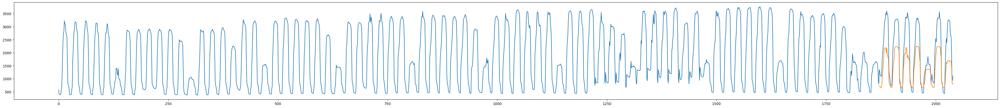

__________Buildding Number:65 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8}
_____SMAPE Score________ 38.655282551866684
65_____Best Iteration_____ 467 _____SMAPE Score________ 10.928858585256915
65_____Best Alpha_____ 1 _____SMAPE Score_____ 8.56680478265227
65_____SMAPE Score_____ 8.56680478265227


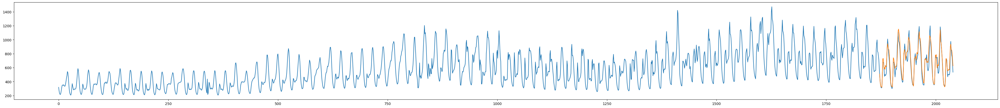

__________Buildding Number:87 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 46.241300019797244
87_____Best Iteration_____ 283 _____SMAPE Score________ 8.299751955757952
87_____Best Alpha_____ 100 _____SMAPE Score_____ 8.299751955757952
87_____SMAPE Score_____ 9.214632765777047


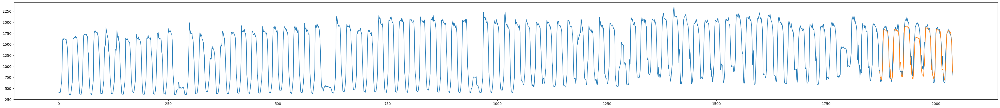

__________Buildding Number:88 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 9, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 50.203687269166686
88_____Best Iteration_____ 226 _____SMAPE Score________ 11.886198699254876
88_____Best Alpha_____ 100 _____SMAPE Score_____ 11.886198699254876
88_____SMAPE Score_____ 18.81366687817951


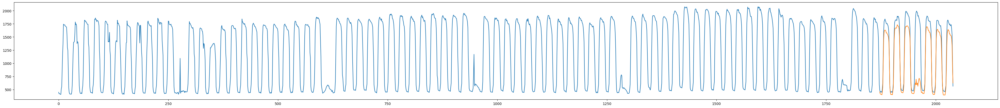

__________Buildding Number:89 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
_____SMAPE Score________ 50.36446209697509
89_____Best Iteration_____ 222 _____SMAPE Score________ 10.551878738545371
89_____Best Alpha_____ 100 _____SMAPE Score_____ 10.551878738545371
89_____SMAPE Score_____ 17.73380717580742


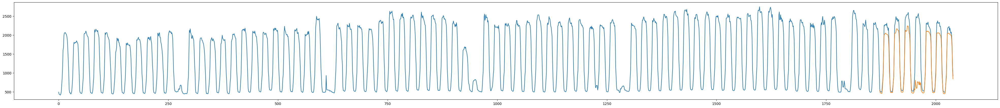

__________Buildding Number:90 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 51.79998226934992
90_____Best Iteration_____ 229 _____SMAPE Score________ 11.285097813411126
90_____Best Alpha_____ 100 _____SMAPE Score_____ 11.285097813411126
90_____SMAPE Score_____ 19.728363570759253


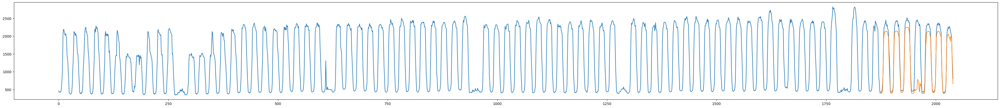

__________Buildding Number:91 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 48.2987184656606
91_____Best Iteration_____ 288 _____SMAPE Score________ 12.697415335565458
91_____Best Alpha_____ 100 _____SMAPE Score_____ 12.697415335565458
91_____SMAPE Score_____ 14.853549075034442


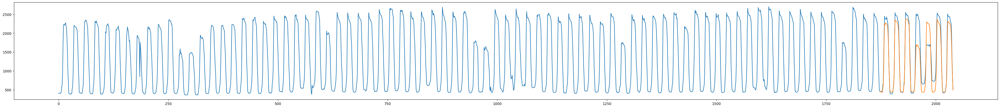

__________Buildding Number:92 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8}
_____SMAPE Score________ 46.75565545123796
92_____Best Iteration_____ 240 _____SMAPE Score________ 7.921150681538272
92_____Best Alpha_____ 100 _____SMAPE Score_____ 7.921150681538272
92_____SMAPE Score_____ 12.709764392903654


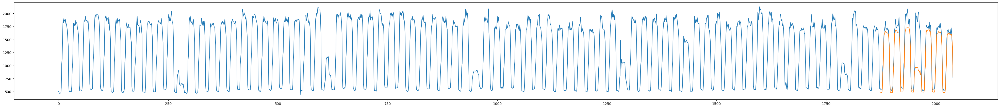

__________Buildding Number:93 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 43.16179806934066
93_____Best Iteration_____ 390 _____SMAPE Score________ 6.235115601675833
93_____Best Alpha_____ 100 _____SMAPE Score_____ 6.235115601675833
93_____SMAPE Score_____ 7.2100532120809255


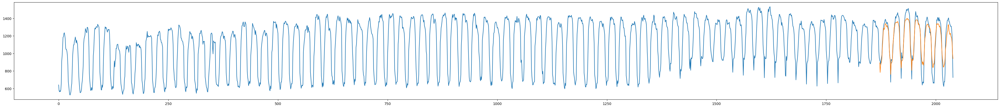

__________Buildding Number:94 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 46.404887597376195
94_____Best Iteration_____ 433 _____SMAPE Score________ 5.562682472262991
94_____Best Alpha_____ 100 _____SMAPE Score_____ 5.562682472262991
94_____SMAPE Score_____ 6.407029389956723


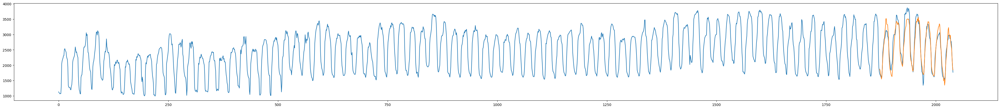

__________Buildding Number:95 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 30.14904653107021
95_____Best Iteration_____ 257 _____SMAPE Score________ 17.44969520108242
95_____Best Alpha_____ 1 _____SMAPE Score_____ 14.245553166536464
95_____SMAPE Score_____ 14.245553166536464


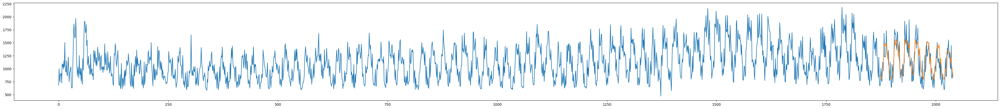

__________Buildding Number:98 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 36.715290328553046
98_____Best Iteration_____ 352 _____SMAPE Score________ 16.42743256623055
98_____Best Alpha_____ 1 _____SMAPE Score_____ 12.422183552252488
98_____SMAPE Score_____ 12.422183552252488


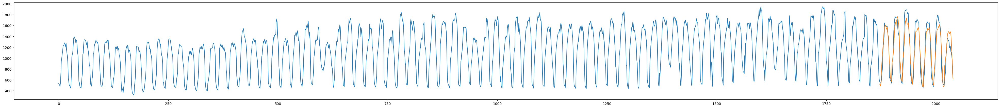

In [54]:
hyperparameters = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample','lambda','gamma','alpha','best_it'])
	#추가 작업 수행
for i in index:
	train_df = pd.read_csv(f'./split/train_valid_building{i}.csv').drop(columns=['Unnamed: 0','index'])
	valid_df = pd.read_csv(f'./split/valid_building{i}.csv').drop(columns=['Unnamed: 0','index'])
	pretest_df = pd.read_csv(f'./split/pretest_building{i}.csv').drop(columns=['Unnamed: 0','index'])
	merge = pd.concat([train_df,valid_df])

	
	pretest_y = pretest_df['power_consumption']
	pretest_x = pretest_df.drop(columns=['power_consumption'])

	#하이퍼 파라미터 튜닝 method 1
	#leaf method
	print(f"__________Buildding Number:{i} Hyperparameter Tuning__________")
	
	preds = np.array([])
	smape_score = make_scorer(SMAPE, greater_is_better=False)
	grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 12, 1), 'max_depth' : np.arange(3,10,1) , 'colsample_bytree' :[0.8, 0.9], 'subsample' : [0.8, 0.9]} 
	grid_under = {}
	#합병된 데이터 사용
	y = merge['power_consumption']
	x = merge.drop(columns=['power_consumption'])
	y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
	#fit
	gcv = GridSearchCV(estimator = XGBRegressor(seed=42,tree_method="hist", gpu_id=0), param_grid=grid, scoring=smape_score, cv=PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168))) ,refit=True, verbose=False)
	gcv.fit(x, y)

	best = gcv.best_estimator_
	params = gcv.best_params_

	#pred
	x_pretest = pretest_df.drop(columns=['power_consumption'])
	y_pretest = pretest_df['power_consumption']
	pred = best.predict(x_pretest)
	print("_____Best Parameters_____",params)
	print("_____SMAPE Score________", SMAPE(y_pretest, pred))

	#n_estimators method
	x = train_df.drop(columns=['power_consumption'])
	y = train_df['power_consumption']
	valid_x = valid_df.drop(columns=['power_consumption'])
	valid_y = valid_df['power_consumption']
 
	xgb_est = XGBRegressor(tree_method="hist",  gpu_id=0,  seed = 42,
					n_estimators = 10000, eta = 0.01,
					max_depth = params['max_depth'],
					min_child_weight = params['min_child_weight'],
					colsample_bytree = params['colsample_bytree'],
					subsample = params['subsample'])
	xgb_est.set_params(**{'objective':weighted_mse(100)})
	xgb_est.fit(x, y, eval_set=[(x, y),(valid_x, valid_y)], 
			early_stopping_rounds=300, verbose=False)

	it_pred = xgb_est.predict(x_pretest)
	best_it= xgb_est.best_iteration
	socre_it = SMAPE(y_pretest, it_pred)
	params['best_it'] = best_it+1
	print(f"{i}_____Best Iteration_____", best_it+1,"_____SMAPE Score________", socre_it)
	#########################################################################################
	#Alpha method
	al_socre = socre_it
	best_alpha = 100
	y = merge['power_consumption']
	x = merge.drop(columns=['power_consumption'])
	for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
			xgb_al = XGBRegressor(tree_method="hist",  gpu_id=0,  seed = 42,
					n_estimators = params['best_it'], eta = 0.01,
					max_depth = params['max_depth'],
					min_child_weight = params['min_child_weight'],
					colsample_bytree = params['colsample_bytree'],
					subsample = params['subsample'])
			xgb_al.set_params(**{'objective' : weighted_mse(j)})

			xgb_al.fit(x, y)
			al_pred = xgb_al.predict(x_pretest)
			score = SMAPE(y_pretest, al_pred)
			
			if score < al_socre:
				best_alpha = j
				al_socre = score
				al_best_pred = al_pred
	params['alpha'] = best_alpha
	print(f"{i}_____Best Alpha_____",best_alpha, "_____SMAPE Score_____",al_socre)
	#시각화
	xgb_final = XGBRegressor(tree_method="hist",  gpu_id=0,  seed = 42,
					n_estimators = params['best_it'], eta = 0.01,
					max_depth = params['max_depth'],
					min_child_weight = params['min_child_weight'],
					colsample_bytree = params['colsample_bytree'],
					subsample = params['subsample'])
	xgb_final.set_params(**{'objective' : weighted_mse(params['alpha'])})
	xgb_final.fit(x,y)
	final_pred = xgb_final.predict(x_pretest)
	final_score = SMAPE(y_pretest, final_pred)
	print(f"{i}_____SMAPE Score_____",final_score)
	hyperparameters = pd.concat([hyperparameters, pd.DataFrame(params, index=[i])], axis=0)
	#y1은 합병과 pretest모두 , y2는 pretest를 pred한 결과
	y1 = pd.concat([merge,pretest_df])['power_consumption']
	y2 = final_pred
	plt.figure(figsize=(50, 5)) 
	plt.plot(np.arange(2040),y1)
	plt.plot(np.arange(2040-168, 2040) ,y2)
	plt.show()


In [23]:
i=14
train = hyper_train.loc[hyper_train.building_number == i].reset_index().drop(columns=['index'])
vaild = hyper_valid.loc[hyper_valid.building_number == i].reset_index().drop(columns=['index'])
#추가 전처리
merge = pd.concat([train, vaild])
merge['power_consumption_lag1'] = merge['power_consumption'].shift(24)
merge['power_consumption_lag2'] = merge['power_consumption'].shift(168)
merge = merge.fillna(0)
merge.head()

,building_number,temperature,rainfall,windspeed,humidity,power_consumption,hour,day,month,week,...,hour_mean,hour_std,CDH,sin_time,cos_time,THI,max_power,min_power,power_consumption_lag1,power_consumption_lag2
0,14,18.7,0.0,4.1,44.0,2187.36,0,2,6,22,...,1615.098353,276.537634,-7.3,0.000000,1.000000,49.2744,2030.571667,2030.571667,0.0,0.0
1,14,18.1,0.0,4.2,47.0,2502.24,1,2,6,22,...,2018.479059,395.924868,-15.2,0.258819,0.965926,47.4981,2030.571667,2030.571667,0.0,0.0
2,14,17.8,0.0,3.0,47.0,2674.08,2,2,6,22,...,2018.665412,454.012206,-23.4,0.500000,0.866025,46.9581,2030.571667,2030.571667,0.0,0.0
3,14,17.8,0.0,3.3,46.0,2670.72,3,2,6,22,...,1948.348235,462.680534,-31.6,0.707107,0.707107,47.1704,2030.571667,2030.571667,0.0,0.0
4,14,18.0,0.0,1.2,53.0,2481.12,4,2,6,22,...,1898.433882,434.532701,-39.6,0.866025,0.500000,46.4601,2030.571667,2030.571667,0.0,0.0


In [12]:
#추가 전처리
merge = pd.concat([train, vaild])
merge['fft'] = FFT(merge, 'power_consumption', 100)
merge = merge.fillna(0)
train = merge[:-168]
vaild = merge[-168:]

In [40]:
smapes = []
def fit(t,v):
	t_x = t.drop(columns=['power_consumption'])
	t_y = t['power_consumption']
	v_x = v.drop(columns=['power_consumption'])
	v_y = v['power_consumption']

	xgb_col = XGBRegressor(tree_method="hist",  gpu_id=0,  seed = 42,
						eta = 0.01,)
	xgb_col.set_params(**{'objective':weighted_mse(100)})
	xgb_col.fit(t_x, t_y, eval_set=[(t_x, t_y),(v_x, v_y)], 
				early_stopping_rounds=300, verbose=False)
	col_pred = xgb_col.predict(v_x)
	socre_col = SMAPE(v_y, col_pred)
	return socre_col

for i in index:
	train_df = pd.read_csv(f'./split/train_valid_building{i}.csv').drop(columns=['Unnamed: 0','index'])
	valid_df = pd.read_csv(f'./split/valid_building{i}.csv').drop(columns=['Unnamed: 0','index'])
	pretest_df = pd.read_csv(f'./split/pretest_building{i}.csv').drop(columns=['Unnamed: 0','index'])
	merge = pd.concat([train_df,valid_df])

	one = fit(merge,pretest_df)
	
	
	merge = pd.concat([merge,pretest_df])
	autocorrelation = merge['power_consumption'].autocorr(lag=168)
	merge = merge.drop(columns='hour')
	two = fit(merge[:-168],merge[-168:])	
	print('one',one,'two',two)
	
	if one > two:	
		print("pick:two")	
		# train_df.to_csv(f'./split/train_valid_building{i}.csv')
		# valid_df.to_csv(f'./split/valid_building{i}.csv')

one 66.40505409172319 two 66.20611102908836
pick:two
one 37.12104586727017 two 37.3647065381071
one 45.60236229797258 two 45.611978444894405
one 50.9899357547098 two 51.00117016624723
one 49.58857568834943 two 49.5885768583332
one 51.09568894902 two 51.112564406712295
one 49.328548505609604 two 49.32608624275917
pick:two
one 47.34417186549471 two 47.3907910250902
one 42.83231178013588 two 42.827714016306594
pick:two
one 46.160893347193635 two 46.20129860938701
one 35.907934985284456 two 35.85953986158118
pick:two
one 36.615760247159464 two 36.621029298481204


__________Buildding Number:54 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.8}
_____SMAPE Score________ 57.49032683543423
54_____Best Iteration_____ 178 _____SMAPE Score________ 22.40915980173044
54_____Best Alpha_____ 100 _____SMAPE Score_____ 22.40915980173044
54_____SMAPE Score_____ 33.76365231218838


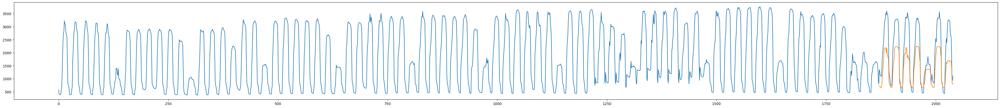

__________Buildding Number:65 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8}
_____SMAPE Score________ 38.655282551866684
65_____Best Iteration_____ 496 _____SMAPE Score________ 11.133897333872808
65_____Best Alpha_____ 1 _____SMAPE Score_____ 8.568173085720801
65_____SMAPE Score_____ 8.568173085720801


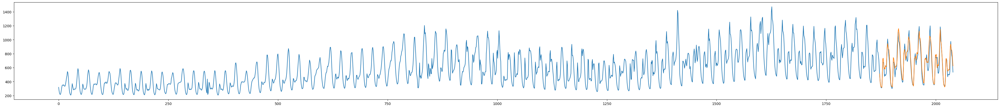

__________Buildding Number:87 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 46.241300019797244
87_____Best Iteration_____ 283 _____SMAPE Score________ 8.299751955757952
87_____Best Alpha_____ 100 _____SMAPE Score_____ 8.299751955757952
87_____SMAPE Score_____ 9.106999463108304


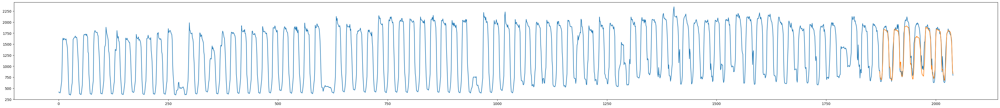

__________Buildding Number:88 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 9, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 50.203687269166686
88_____Best Iteration_____ 226 _____SMAPE Score________ 11.894107697788773
88_____Best Alpha_____ 100 _____SMAPE Score_____ 11.894107697788773
88_____SMAPE Score_____ 18.841645747305808


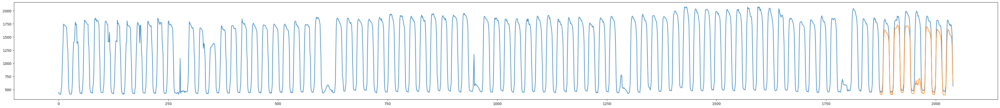

__________Buildding Number:89 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
_____SMAPE Score________ 50.36446209697509
89_____Best Iteration_____ 223 _____SMAPE Score________ 10.413171551740875
89_____Best Alpha_____ 100 _____SMAPE Score_____ 10.413171551740875
89_____SMAPE Score_____ 17.660673300085726


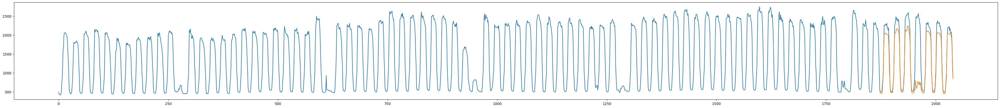

__________Buildding Number:90 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 51.475519123197294
90_____Best Iteration_____ 221 _____SMAPE Score________ 12.564744735154612
90_____Best Alpha_____ 100 _____SMAPE Score_____ 12.564744735154612
90_____SMAPE Score_____ 19.86156615418921


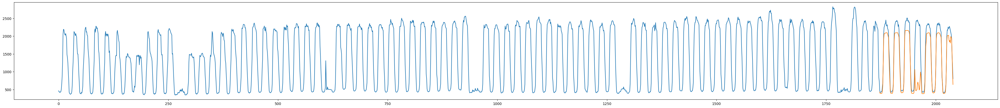

__________Buildding Number:91 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 48.29871824613
91_____Best Iteration_____ 288 _____SMAPE Score________ 12.679836559094387
91_____Best Alpha_____ 100 _____SMAPE Score_____ 12.679836559094387
91_____SMAPE Score_____ 14.85155051290869


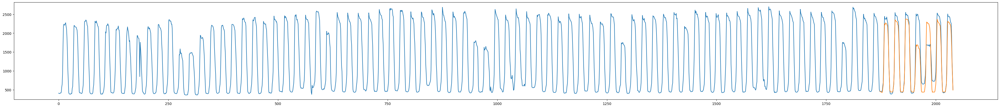

__________Buildding Number:92 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
_____SMAPE Score________ 46.7419901230331
92_____Best Iteration_____ 240 _____SMAPE Score________ 7.920741806762154
92_____Best Alpha_____ 100 _____SMAPE Score_____ 7.920741806762154
92_____SMAPE Score_____ 12.70976767207029


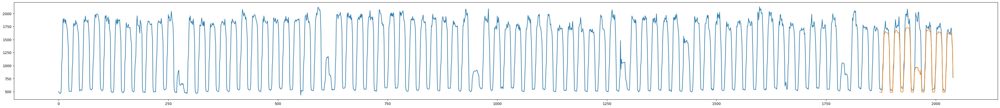

__________Buildding Number:93 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 43.19432668504556
93_____Best Iteration_____ 391 _____SMAPE Score________ 6.260843251667874
93_____Best Alpha_____ 100 _____SMAPE Score_____ 6.260843251667874
93_____SMAPE Score_____ 7.252304921084742


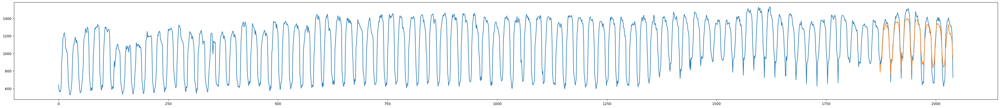

__________Buildding Number:94 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 46.404887597376195
94_____Best Iteration_____ 426 _____SMAPE Score________ 5.5683124715964745
94_____Best Alpha_____ 100 _____SMAPE Score_____ 5.5683124715964745
94_____SMAPE Score_____ 6.37554558081448


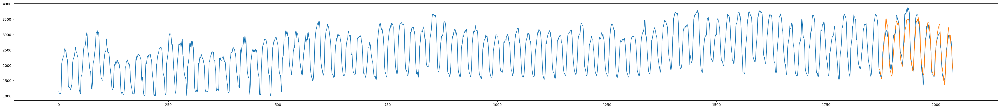

__________Buildding Number:95 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 30.14904653107021
95_____Best Iteration_____ 257 _____SMAPE Score________ 17.44969520108242
95_____Best Alpha_____ 1 _____SMAPE Score_____ 14.244084653930326
95_____SMAPE Score_____ 14.244084653930326


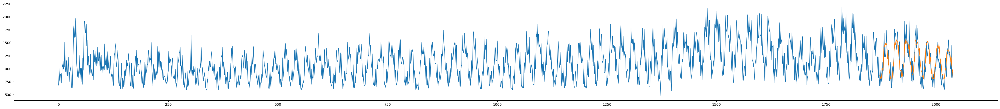

__________Buildding Number:98 Hyperparameter Tuning__________
_____Best Parameters_____ {'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
_____SMAPE Score________ 36.715290328553046
98_____Best Iteration_____ 357 _____SMAPE Score________ 16.499799381494974
98_____Best Alpha_____ 1 _____SMAPE Score_____ 12.452456037054384
98_____SMAPE Score_____ 12.452456037054384


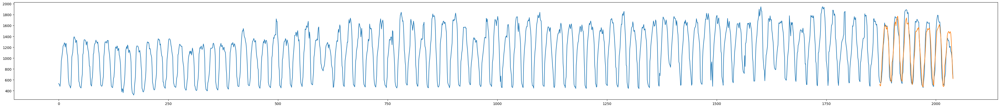

In [35]:
hyperparameters_2 = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample','lambda','gamma','alpha','best_it'])
	#추가 작업 수행
for i in index:
	train_df = pd.read_csv(f'./split/train_valid_building{i}.csv').drop(columns=['Unnamed: 0','index'])
	valid_df = pd.read_csv(f'./split/valid_building{i}.csv').drop(columns=['Unnamed: 0','index'])
	pretest_df = pd.read_csv(f'./split/pretest_building{i}.csv').drop(columns=['Unnamed: 0','index'])
	merge = pd.concat([train_df,valid_df])
	
	
	pretest_y = pretest_df['power_consumption']
	pretest_x = pretest_df.drop(columns=['power_consumption'])
	#####################################################################################
	percente = np.percentile(train_df['power_consumption'],1)
	#####################################################################################
	#하이퍼 파라미터 튜닝 method 1
	#leaf method
	print(f"__________Buildding Number:{i} Hyperparameter Tuning__________")
	
	preds = np.array([])
	smape_score = make_scorer(SMAPE, greater_is_better=False)
	grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 12, 1), 'max_depth' : np.arange(3,10,1) , 'colsample_bytree' :[0.8, 0.9], 'subsample' : [0.8, 0.9]} 
	grid_under = {}
	#합병된 데이터 사용
	y = merge['power_consumption']
	x = merge.drop(columns=['power_consumption'])
	y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
	#fit
	gcv = GridSearchCV(estimator = XGBRegressor(seed=42,tree_method="hist", gpu_id=0), param_grid=grid, scoring=smape_score, cv=PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168))) ,refit=True, verbose=False)
	gcv.fit(x, y)

	best = gcv.best_estimator_
	params = gcv.best_params_

	#pred
	x_pretest = pretest_df.drop(columns=['power_consumption'])
	y_pretest = pretest_df['power_consumption']
	pred = best.predict(x_pretest)
	print("_____Best Parameters_____",params)
	print("_____SMAPE Score________", SMAPE(y_pretest, pred))
	######################################################################################

	######################################################################################
	#n_estimators method
	x = train_df.drop(columns=['power_consumption'])
	y = train_df['power_consumption']
	valid_x = valid_df.drop(columns=['power_consumption'])
	valid_y = valid_df['power_consumption']
 
	xgb_est = XGBRegressor(tree_method="hist",  gpu_id=0,  seed = 42,
					n_estimators = 10000, eta = 0.01,
					max_depth = params['max_depth'],
					min_child_weight = params['min_child_weight'],
					colsample_bytree = params['colsample_bytree'],
					subsample = params['subsample'])
	xgb_est.set_params(**{'objective':weighted_mse(100)})
	xgb_est.fit(x, y, eval_set=[(x, y),(valid_x, valid_y)], 
			early_stopping_rounds=300, verbose=False)

	it_pred = xgb_est.predict(x_pretest)
	best_it= xgb_est.best_iteration
	socre_it = SMAPE(y_pretest, it_pred)
	params['best_it'] = best_it+1
	print(f"{i}_____Best Iteration_____", best_it+1,"_____SMAPE Score________", socre_it)
	#########################################################################################
	#Alpha method
	al_socre = socre_it
	best_alpha = 100
	y = merge['power_consumption']
	x = merge.drop(columns=['power_consumption'])
	for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
			xgb_al = XGBRegressor(tree_method="hist",  gpu_id=0,  seed = 42,
					n_estimators = params['best_it'], eta = 0.01,
					max_depth = params['max_depth'],
					min_child_weight = params['min_child_weight'],
					colsample_bytree = params['colsample_bytree'],
					subsample = params['subsample'])
			xgb_al.set_params(**{'objective' : weighted_mse(j)})

			xgb_al.fit(x, y)
			al_pred = xgb_al.predict(x_pretest)
			score = SMAPE(y_pretest, al_pred)
			
			if score < al_socre:
				best_alpha = j
				al_socre = score
				al_best_pred = al_pred
	params['alpha'] = best_alpha
	print(f"{i}_____Best Alpha_____",best_alpha, "_____SMAPE Score_____",al_socre)
	#시각화
	xgb_final = XGBRegressor(tree_method="hist",  gpu_id=0,  seed = 42,
					n_estimators = params['best_it'], eta = 0.01,
					max_depth = params['max_depth'],
					min_child_weight = params['min_child_weight'],
					colsample_bytree = params['colsample_bytree'],
					subsample = params['subsample'])
	xgb_final.set_params(**{'objective' : weighted_mse(params['alpha'])})
	xgb_final.fit(x,y)
	final_pred = xgb_final.predict(x_pretest)
	final_score = SMAPE(y_pretest, final_pred)
	print(f"{i}_____SMAPE Score_____",final_score)
	hyperparameters_2 = pd.concat([hyperparameters_2, pd.DataFrame(params, index=[i])], axis=0)
	#y1은 합병과 pretest모두 , y2는 pretest를 pred한 결과
	y1 = pd.concat([merge,pretest_df])['power_consumption']
	y2 = final_pred
	plt.figure(figsize=(50, 5)) 
	plt.plot(np.arange(2040),y1)
	plt.plot(np.arange(2040-168, 2040) ,y2)
	plt.show()


building_number54


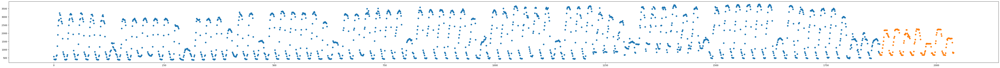

building_number65


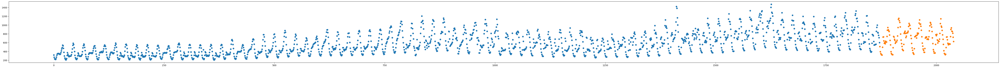

building_number87


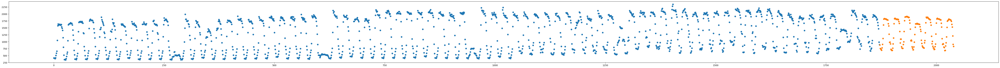

building_number88


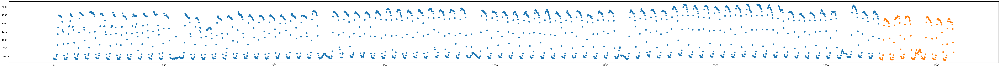

building_number89


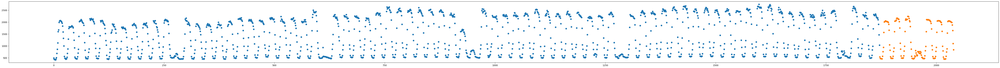

In [59]:
xgbs = []
k = 0
hy = hyperparameters
for i in index:
        train_df = pd.read_csv(f'./split/train_valid_building{i}.csv').drop(columns=['Unnamed: 0','index'])
        valid_df = pd.read_csv(f'./split/valid_building{i}.csv').drop(columns=['Unnamed: 0','index'])
        pretest_df = pd.read_csv(f'./split/pretest_building{i}.csv').drop(columns=['Unnamed: 0','index'])
        merge = pd.concat([train_df,valid_df])


        pretest_y = pretest_df['power_consumption']
        pretest_x = pretest_df.drop(columns=['power_consumption'])
        ######################################################################

        ######################################################################
        x_df = merge.drop(columns=['power_consumption'])
        y_df = merge['power_consumption']
        xgb = XGBRegressor(tree_method="hist",  gpu_id=0,  seed = 42,
                n_estimators = hy.at[i,'best_it'], eta = 0.01,
                max_depth = hy.at[i,'max_depth'],
                min_child_weight = hy.at[i,'min_child_weight'],
                colsample_bytree = hy.at[i,'colsample_bytree'],
                subsample = hy.at[i,'subsample'])
        xgb.set_params(**{'objective' : weighted_mse(hy.at[i,'alpha'])})
        xgb.fit(x_df, y_df)
        pred = xgb.predict(pretest_x)
        xgbs.append(xgb)
        print(f"building_number{i}")
        plt.figure(figsize=(80, 5)) 
        plt.scatter(np.arange(1872),y_df)
        plt.scatter(np.arange(1872, 2040) ,pred)

        plt.show()

building_number: 0.0
temperature: 0.028437795117497444
rainfall: 0.0
windspeed: 0.004958405625075102
humidity: 0.0
hour: 0.01470186561346054
day: 0.1423444151878357
month: 0.022239679470658302
week: 0.01817653514444828
holiday: 0.0
day_hour_mean: 0.3306332230567932
day_hour_std: 0.015557029284536839
hour_mean: 0.30912354588508606
hour_std: 0.07335437834262848
CDH: 0.018013855442404747
sin_time: 0.003158095059916377
cos_time: 0.008822419680655003
THI: 0.006872928701341152
max_power: 0.003605861449614167
min_power: 0.0
buildfing bumner 54


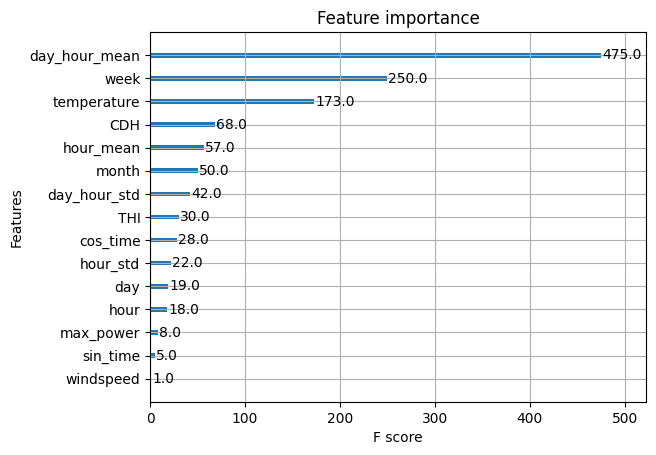

building_number: 0.0
temperature: 0.024058600887656212
rainfall: 0.0030311141163110733
windspeed: 0.0040122829377651215
humidity: 0.006634680088609457
hour: 0.02598744072020054
day: 0.004708407446742058
month: 0.2814269959926605
week: 0.08879926800727844
holiday: 0.006738573312759399
day_hour_mean: 0.20783694088459015
day_hour_std: 0.04481839761137962
hour_mean: 0.0945662185549736
hour_std: 0.03905089572072029
CDH: 0.11495313793420792
sin_time: 0.007718256209045649
cos_time: 0.01948554627597332
THI: 0.016292134299874306
max_power: 0.005048765800893307
min_power: 0.00483235577121377
buildfing bumner 65


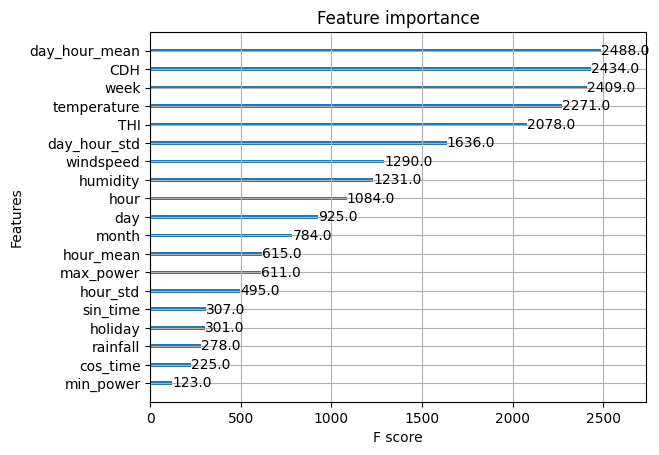

building_number: 0.0
temperature: 0.013443062081933022
rainfall: 0.0007955284672789276
windspeed: 0.005724025424569845
humidity: 0.002656739205121994
hour: 0.00766728725284338
day: 0.007764041889458895
month: 0.032087430357933044
week: 0.05373980849981308
holiday: 0.0058105504140257835
day_hour_mean: 0.41990798711776733
day_hour_std: 0.010134671814739704
hour_mean: 0.16209383308887482
hour_std: 0.014880734495818615
CDH: 0.006942892447113991
sin_time: 0.04476878046989441
cos_time: 0.18835760653018951
THI: 0.00954084750264883
max_power: 0.006363946478813887
min_power: 0.007320224307477474
buildfing bumner 87


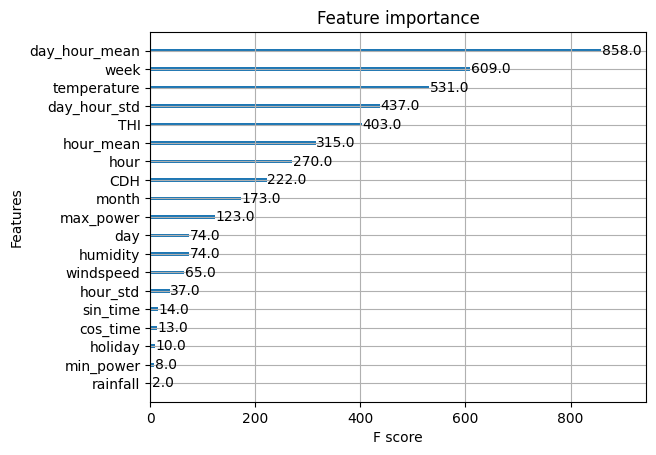

building_number: 0.0
temperature: 0.004708613734692335
rainfall: 0.0019101313082501292
windspeed: 0.0018885373137891293
humidity: 0.004650913178920746
hour: 0.0066372789442539215
day: 0.014478216879069805
month: 0.006861723028123379
week: 0.017501842230558395
holiday: 0.0014545867452397943
day_hour_mean: 0.4478064775466919
day_hour_std: 0.007472881115972996
hour_mean: 0.2755424380302429
hour_std: 0.1338670402765274
CDH: 0.006844798102974892
sin_time: 0.010199128650128841
cos_time: 0.012854434549808502
THI: 0.0120294950902462
max_power: 0.019818494096398354
min_power: 0.013472911901772022
buildfing bumner 88


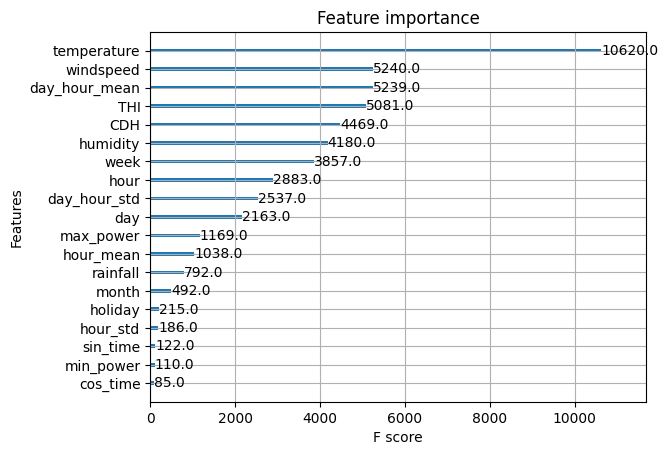

building_number: 0.0
temperature: 0.007552920375019312
rainfall: 0.0015381125267595053
windspeed: 0.0025829565711319447
humidity: 0.005945573095232248
hour: 0.01369103416800499
day: 0.019144710153341293
month: 0.051758408546447754
week: 0.030800841748714447
holiday: 0.0030112904496490955
day_hour_mean: 0.4460696578025818
day_hour_std: 0.015721136704087257
hour_mean: 0.25014546513557434
hour_std: 0.06202007085084915
CDH: 0.01134747825562954
sin_time: 0.0021717657800763845
cos_time: 0.009874753654003143
THI: 0.01770947501063347
max_power: 0.028706982731819153
min_power: 0.020207323133945465
buildfing bumner 89


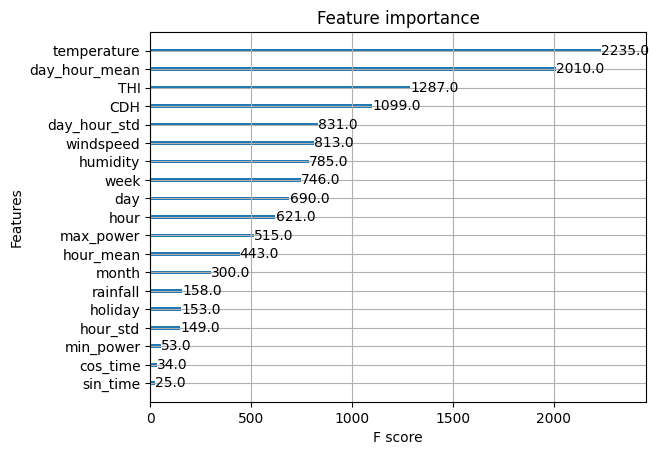

building_number: 0.0
temperature: 0.0037544695660471916
rainfall: 0.0008577884291298687
windspeed: 0.0023103051353245974
humidity: 0.023964567109942436
hour: 0.012729470618069172
day: 0.012397104874253273
month: 0.007982930168509483
week: 0.024459809064865112
holiday: 0.008103211410343647
day_hour_mean: 0.3138391971588135
day_hour_std: 0.010105411522090435
hour_mean: 0.34879475831985474
hour_std: 0.153647780418396
CDH: 0.004347266163676977
sin_time: 0.0021355473436415195
cos_time: 0.0027139687445014715
THI: 0.028707541525363922
max_power: 0.02007945068180561
min_power: 0.019069543108344078
buildfing bumner 90


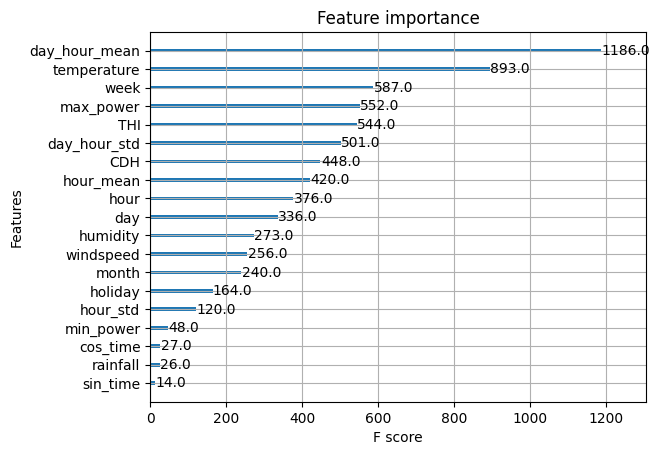

building_number: 0.0
temperature: 0.006290818098932505
rainfall: 0.004001634661108255
windspeed: 0.001394091290421784
humidity: 0.002327687107026577
hour: 0.004082053899765015
day: 0.0009846679167822003
month: 0.002521516289561987
week: 0.004154075402766466
holiday: 0.002333923475816846
day_hour_mean: 0.24832449853420258
day_hour_std: 0.002783783245831728
hour_mean: 0.1858355700969696
hour_std: 0.5116890072822571
CDH: 0.005065343342721462
sin_time: 0.003039053874090314
cos_time: 0.0008151304791681468
THI: 0.005805010907351971
max_power: 0.0047994391061365604
min_power: 0.0037527901586145163
buildfing bumner 91


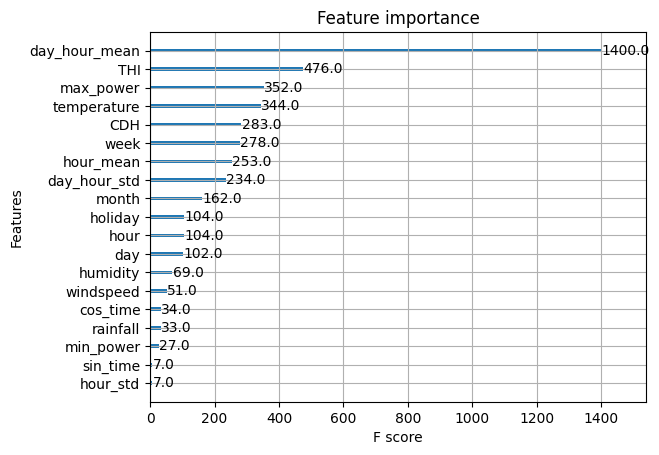

building_number: 0.0
temperature: 0.0036157502327114344
rainfall: 0.0004369294620119035
windspeed: 0.002184715587645769
humidity: 0.004111886490136385
hour: 0.026692550629377365
day: 0.023431455716490746
month: 0.007262459024786949
week: 0.006388974376022816
holiday: 0.0042563616298139095
day_hour_mean: 0.3459228575229645
day_hour_std: 0.007355467416346073
hour_mean: 0.27013370394706726
hour_std: 0.18664856255054474
CDH: 0.004992529284209013
sin_time: 0.00036875889054499567
cos_time: 0.0749807134270668
THI: 0.0025641999673098326
max_power: 0.01627351902425289
min_power: 0.01237860880792141
buildfing bumner 92


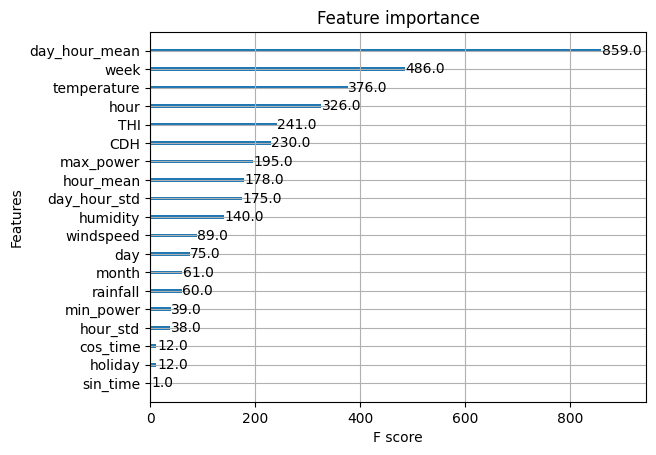

building_number: 0.0
temperature: 0.02078695222735405
rainfall: 0.0009251816081814468
windspeed: 0.0017769770929589868
humidity: 0.0018296660855412483
hour: 0.042731352150440216
day: 0.005616283044219017
month: 0.031953707337379456
week: 0.04603027552366257
holiday: 0.005876064300537109
day_hour_mean: 0.32519516348838806
day_hour_std: 0.009661362506449223
hour_mean: 0.37477660179138184
hour_std: 0.07124798744916916
CDH: 0.0028051496483385563
sin_time: 0.0009659520583227277
cos_time: 0.003604938741773367
THI: 0.05148518085479736
max_power: 0.002266133204102516
min_power: 0.00046501838369295
buildfing bumner 93


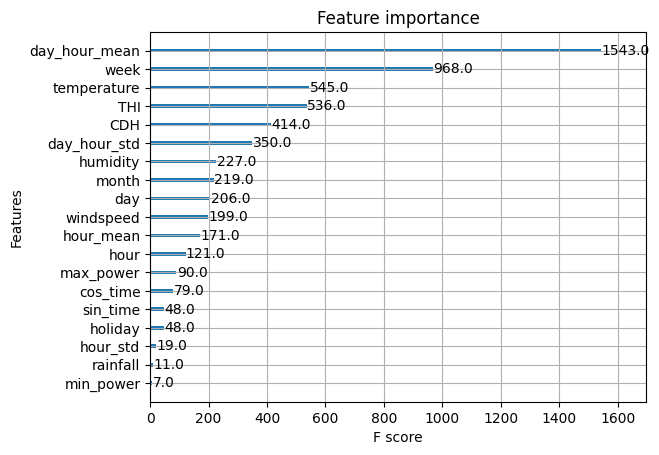

building_number: 0.0
temperature: 0.026807421818375587
rainfall: 0.00287075387313962
windspeed: 0.0025215046480298042
humidity: 0.00730890454724431
hour: 0.007139915134757757
day: 0.008798226714134216
month: 0.02167210727930069
week: 0.04461507126688957
holiday: 0.0047385310754179955
day_hour_mean: 0.3526093661785126
day_hour_std: 0.006400769576430321
hour_mean: 0.32100000977516174
hour_std: 0.08118420839309692
CDH: 0.011176835745573044
sin_time: 0.0025744254235178232
cos_time: 0.013026376254856586
THI: 0.07307756692171097
max_power: 0.006345358211547136
min_power: 0.006132872775197029
buildfing bumner 94


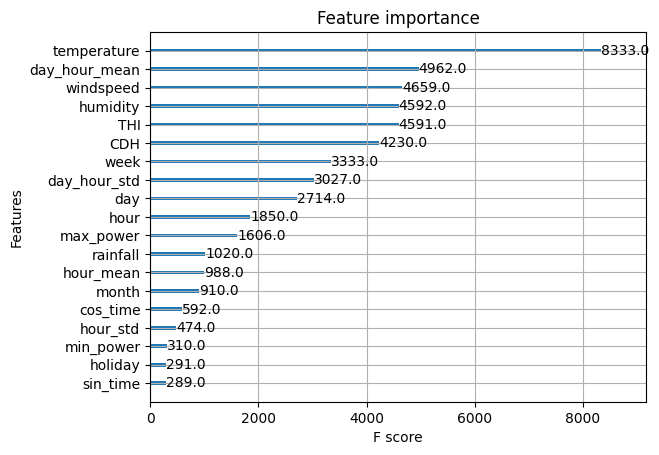

building_number: 0.0
temperature: 0.04515835642814636
rainfall: 0.005040918011218309
windspeed: 0.007974543608725071
humidity: 0.013941078446805477
hour: 0.019518794491887093
day: 0.00806363858282566
month: 0.03325953334569931
week: 0.06106031313538551
holiday: 0.008733433671295643
day_hour_mean: 0.16533628106117249
day_hour_std: 0.02128588780760765
hour_mean: 0.28077736496925354
hour_std: 0.2482617199420929
CDH: 0.010105280205607414
sin_time: 0.007212857715785503
cos_time: 0.02714894898235798
THI: 0.020581228658556938
max_power: 0.007696513086557388
min_power: 0.008843455463647842
buildfing bumner 95


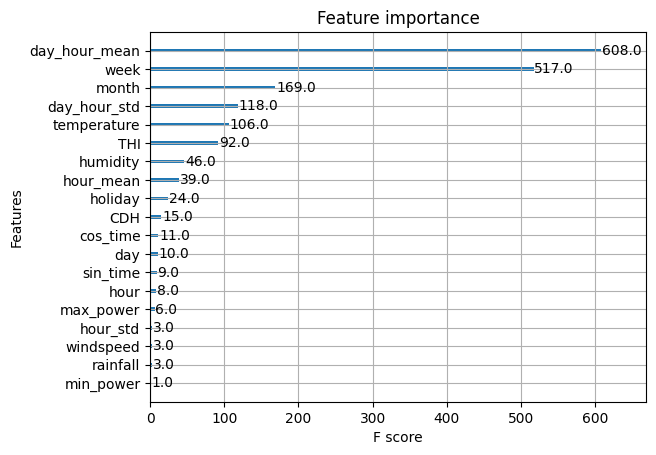

building_number: 0.0
temperature: 0.015090398490428925
rainfall: 0.00484924903139472
windspeed: 0.0030149631202220917
humidity: 0.0040639410726726055
hour: 0.05167560279369354
day: 0.0036225849762558937
month: 0.05984501540660858
week: 0.05021955817937851
holiday: 0.0022772245574742556
day_hour_mean: 0.3617381453514099
day_hour_std: 0.006109329406172037
hour_mean: 0.38807278871536255
hour_std: 0.016371654346585274
CDH: 0.004428341053426266
sin_time: 0.0032513232436031103
cos_time: 0.005195350386202335
THI: 0.012504755519330502
max_power: 0.003730331314727664
min_power: 0.003939433488994837
buildfing bumner 98


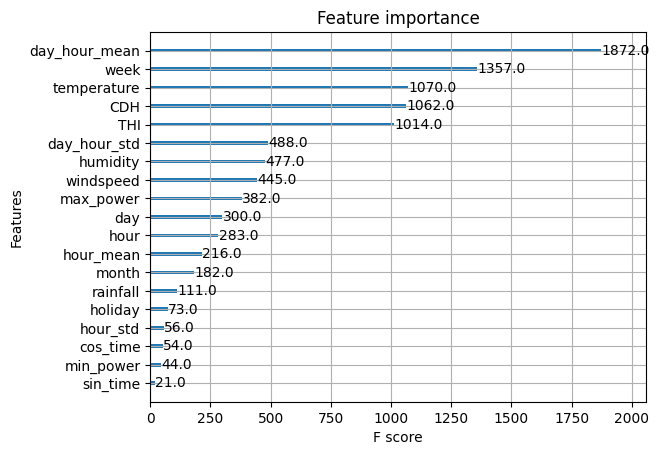

In [56]:
import xgboost as xgb
import matplotlib.pyplot as plt
count  = 0
for k in xgbs:
  # 피처 중요도 확인
  feature_importances = k.feature_importances_
  # 피처 중요도를 출력합니다.(위에서 5개만)
  for i, feat_importance in enumerate(feature_importances):
    print(f"{x.columns[i]}: {feat_importance}")
  # 피처 중요도를 시각화합니다.
  xgb.plot_importance(k)  
  print('buildfing bumner',index[count])
  count = count+1
  plt.show()